Léa ZADIKIAN - Décembre 2022
# Projet n° 5 : Segmentez des clients d'un site e-commerce
# Notebook n°1/3 : Exploration
Données et définition des variables : https://www.kaggle.com/datasets/olistbr/brazilian-ecommerce

**Objectif** : 
# Sommaire :
<a href="#C1">1. Import des librairies</a>

<a href="#C2">2. Fichier des clients : olist_order_customers_dataset</a>

<a href="#C3">3. Fichier des items de commande : olist_order_items_dataset</a>

<a href="#C4">4. Fichier des paiements : olist_order_payments_dataset</a>

<a href="#C5">5. Fichier des avis clients : olist_order_reviews_dataset</a>

<a href="#C6">6. Fichier des commandes : olist_orders_dataset</a>

<a href="#C7">7. Fichier des produits : olist_products_dataset</a>


<a href="#C8">8. Feature engineering</a>

    - Features RFM (Recency / Frequency / Monetary)
    - Review Score



# <a name="C1">1. Import des librairies</a>

In [1]:
! pip install yellowbrick
import pandas as pd
import numpy as np
from pandas.plotting import scatter_matrix
import missingno as msno
from datetime import timedelta


import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from mpl_toolkits.mplot3d import axes3d  # Fonction pour la 3D


Defaulting to user installation because normal site-packages is not writeable


# <a name="C2">2. Fichier des clients : olist_order_customers_dataset</a>

In [2]:
#Lecture et affichage du fichier 'olist_customers_dataset '
customer_dataset=pd.read_csv('olist_customers_dataset.csv')
customer_dataset

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP
...,...,...,...,...,...
99436,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP
99437,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,6764,taboao da serra,SP
99438,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,60115,fortaleza,CE
99439,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,92120,canoas,RS


In [3]:
print("Nombre de 'customer_id' unique  : " + str(customer_dataset['customer_id'].nunique()))
print("Nombre de 'customer_unique_id' unique  : " + str(customer_dataset['customer_unique_id'].nunique()))
print("% clients commande unique : "+ str(customer_dataset['customer_unique_id'].nunique()/customer_dataset['customer_id'].nunique()))

Nombre de 'customer_id' unique  : 99441
Nombre de 'customer_unique_id' unique  : 96096
% clients commande unique : 0.9663619633752677


In [4]:
#Affichage du type des données
customer_dataset.dtypes

customer_id                 object
customer_unique_id          object
customer_zip_code_prefix     int64
customer_city               object
customer_state              object
dtype: object

In [5]:
# Remplissage du jeu de données en % du nombre total de données
print("Taux de remplissage en % du jeu de données : "+str ((1-round(customer_dataset.isna().mean().mean(),3))*100)+" %.")

Taux de remplissage en % du jeu de données : 100.0 %.


In [6]:
# Observations des valeurs uniques prises par les variables catégorielles
print('OBSERVATIONS DES VALEURS PRISES PAR LES VARIABLES CATEGORIELLES : \n' )
print( 'customer_zip_code_prefix : \n' + str(customer_dataset['customer_zip_code_prefix'].unique())+'\n')
print( 'customer_state : \n' + str(customer_dataset['customer_state'].unique())+'\n')
print( 'customer_city : \n' + str(customer_dataset['customer_city'].unique().tolist())+'\n')

OBSERVATIONS DES VALEURS PRISES PAR LES VARIABLES CATEGORIELLES : 

customer_zip_code_prefix : 
[14409  9790  1151 ...  5538 74980 99043]

customer_state : 
['SP' 'SC' 'MG' 'PR' 'RJ' 'RS' 'PA' 'GO' 'ES' 'BA' 'MA' 'MS' 'CE' 'DF'
 'RN' 'PE' 'MT' 'AM' 'AP' 'AL' 'RO' 'PB' 'TO' 'PI' 'AC' 'SE' 'RR']

customer_city : 
['franca', 'sao bernardo do campo', 'sao paulo', 'mogi das cruzes', 'campinas', 'jaragua do sul', 'timoteo', 'curitiba', 'belo horizonte', 'montes claros', 'rio de janeiro', 'lencois paulista', 'caxias do sul', 'piracicaba', 'guarulhos', 'pacaja', 'florianopolis', 'aparecida de goiania', 'santo andre', 'goiania', 'cachoeiro de itapemirim', 'sao jose dos campos', 'sao roque', 'camacari', 'resende', 'sumare', 'novo hamburgo', 'sao luis', 'sao jose', 'santa barbara', 'ribeirao preto', 'ituiutaba', 'taquarituba', 'sao jose dos pinhais', 'barrinha', 'parati', 'dourados', 'trindade', 'cascavel', 'fortaleza', 'brasilia', 'pelotas', 'porto alegre', 'salto', 'jundiai', 'cacapava', 'sao v

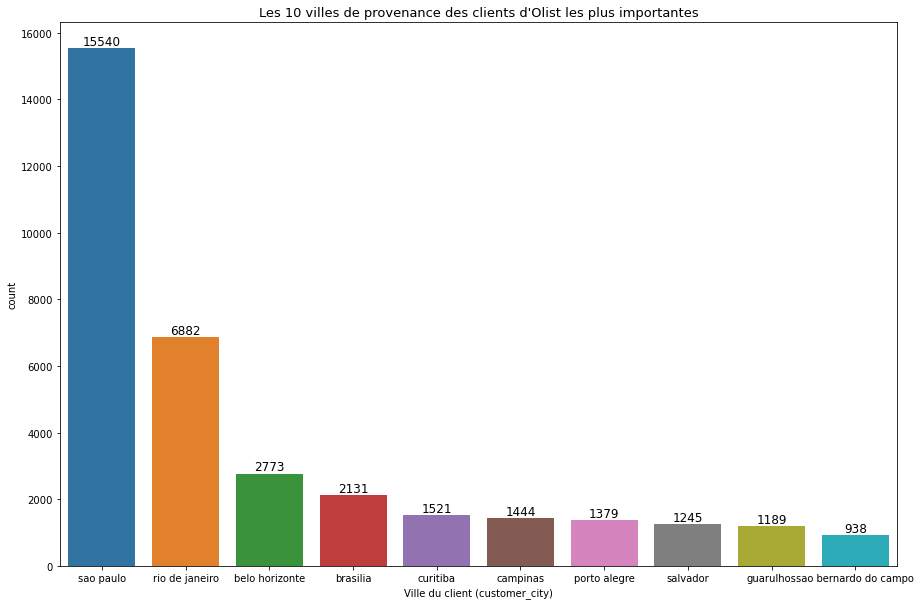

In [7]:
#Distribution de la variable de la ville du client customer_city

labels =customer_dataset['customer_city'].value_counts(normalize=True).sort_values(ascending=False).head(10).index
fig,ax=plt.subplots(figsize=(15,10))
sns.countplot(x = customer_dataset['customer_city'], order=labels)
plt.title("Les 10 villes de provenance des clients d'Olist les plus importantes",fontsize=13)
plt.xlabel("Ville du client (customer_city)")
#Affichage de la valeur au dessus des barres
for container in ax.containers:
    ax.bar_label(container,size=12,fmt='%.0f')
plt.show()

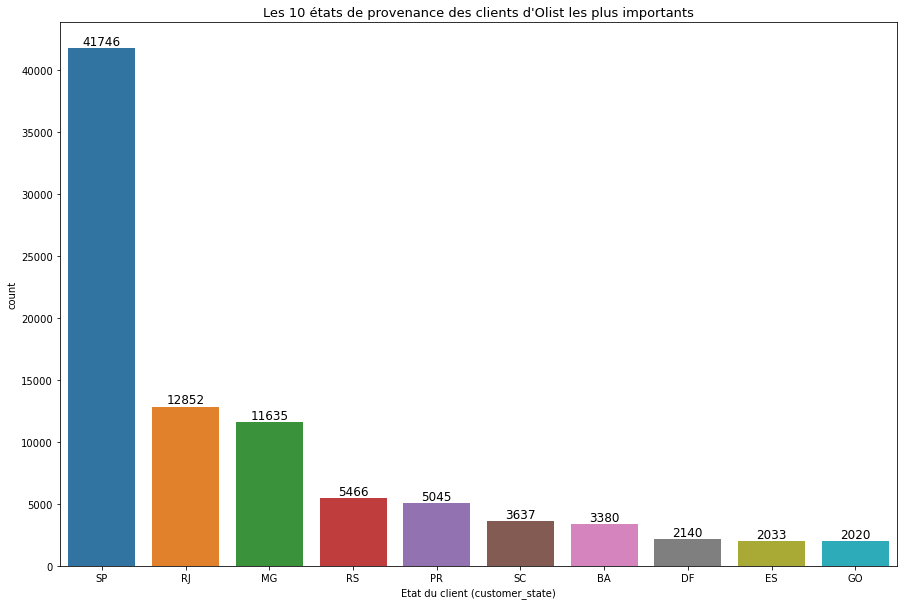

In [8]:
# Distribution la variable customer_state

labels =customer_dataset['customer_state'].value_counts(normalize=True).sort_values(ascending=False).head(10).index
fig,ax=plt.subplots(figsize=(15,10))
sns.countplot(x = customer_dataset['customer_state'], order=labels)
plt.title("Les 10 états de provenance des clients d'Olist les plus importants",fontsize=13)
plt.xlabel("Etat du client (customer_state)")
for container in ax.containers:
    ax.bar_label(container,size=12,fmt='%.0f')

**Conclusion sur le fichier clients olist_customers_dataset**

Le fichier comporte 99 441 lignes, chaque ligne est un client.

Le fichier comporte 5 colonnes : identifiant client pour une commande, identifiant unique du client, information sur la localisation du client : code postale, ville et état (du Brésil) du client.

L'identifiant unique du client est customer_unique_id, et non pas customer_id qui est l'identifiant du client pour une commande donnée.

Le fichier ne comporte aucune valeur manquante.

96,6% des commandes sont passées par des clients différents et 3,4% des commandes par des clients qui ont passé 2 commandes ou plus.

42% des commandes viennent de l'Etat de Sao Paulo(SP), 13% de l'Etat de Rio de Janeiro (RJ) et 12% de l'Etat de Minas Gerais ( MG).
16% des commandes viennent de la ville de Sao Paulo, 7% des commandes de la ville de Rio de Janeiro et 3% de la ville de Belo horizonte. Ce sont donc les plus grandes villes de chacun des 3 états qui arrivent en tête.

# <a name="C3">3. Fichier des items de commandes : olist_order_items_dataset</a>

In [9]:
#Lecture et affichage du fichier ' olist_order_items_dataset '
items_dataset=pd.read_csv('olist_order_items_dataset.csv')
items_dataset

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14
...,...,...,...,...,...,...,...
112645,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41
112646,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53
112647,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95
112648,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72


In [10]:
#Affichage du type des données
items_dataset.dtypes

order_id                object
order_item_id            int64
product_id              object
seller_id               object
shipping_limit_date     object
price                  float64
freight_value          float64
dtype: object

In [11]:
# shipping_limit_date est de type "object", on le convertit en date
items_dataset['shipping_limit_date'] = pd.to_datetime(items_dataset['shipping_limit_date'])
items_dataset.dtypes

order_id                       object
order_item_id                   int64
product_id                     object
seller_id                      object
shipping_limit_date    datetime64[ns]
price                         float64
freight_value                 float64
dtype: object

In [12]:
# Remplissage du jeu de données en % du nombre total de données
(1-round(items_dataset.isna().mean().mean(),3))*100

100.0

In [13]:
items_dataset.describe()

,order_item_id,price,freight_value
count,112650.000000,112650.000000,112650.000000
mean,1.197834,120.653739,19.990320
std,0.705124,183.633928,15.806405
min,1.000000,0.850000,0.000000
25%,1.000000,39.900000,13.080000
50%,1.000000,74.990000,16.260000
75%,1.000000,134.900000,21.150000
max,21.000000,6735.000000,409.680000


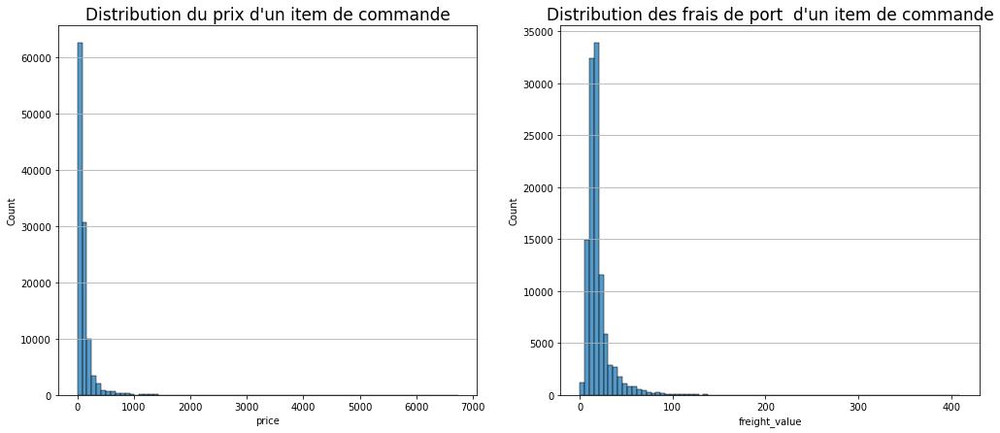

In [14]:
# Représentation graphique de la distribution du prix d'un item de commande et des frais de port associé
fig=plt.figure(figsize = (17,7))

ax = fig.add_subplot(1,2, 1)
sns.histplot(x=items_dataset['price'],bins=80,)
ax.set_title("Distribution du prix d'un item de commande", fontsize=17)
plt.grid(axis='y')


ax = fig.add_subplot(1,2, 2)
sns.histplot(x=items_dataset['freight_value'],bins=80,)
ax.set_title("Distribution des frais de port  d'un item de commande", fontsize=17)
plt.grid(axis='y')


In [15]:
# Types et valeurs manquantes
items_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   order_id             112650 non-null  object        
 1   order_item_id        112650 non-null  int64         
 2   product_id           112650 non-null  object        
 3   seller_id            112650 non-null  object        
 4   shipping_limit_date  112650 non-null  datetime64[ns]
 5   price                112650 non-null  float64       
 6   freight_value        112650 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 6.0+ MB


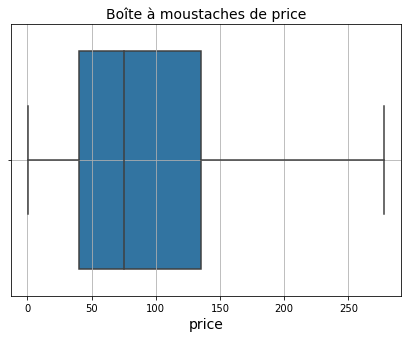

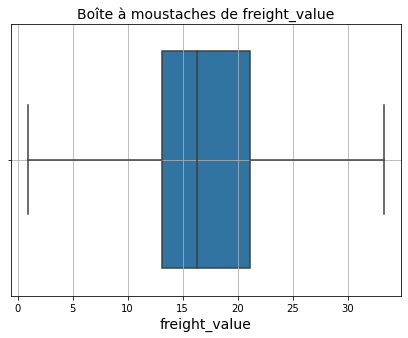

In [16]:
# Boxplot des variables numériques items_dataset
for column in items_dataset.select_dtypes(include='float64'):
    plt.figure(figsize = (7,5))
    sns.boxplot(x=items_dataset[column],showfliers=False)
    plt.title("Boîte à moustaches de " + column,fontsize=14)
    plt.xlabel(column,fontsize=14)
    plt.grid(True)
    plt.show()

**Conclusion sur le fichier clients olist_order_items_dataset**


Le fichier comporte 112.650 lignes, chaque ligne est un item de commande, c'est à dire un élément de la commande.

Le fichier comporte  7 colonnes : identifiant de la commande, le nb d'items dans la commande, l'identification du produit, l'identification du vendeur, la date limite d'expédition de l'item, le prix de l'item et les frais de port de l'item. Si une commande comporte plusieurs items, les frais de port sont répartis entre les items de la commande.

Le jeu de données ne comporte par de valeurs manquantes.
En moyenne, une commande comporte 1 item et le prix moyen de l'item est de 120€.
Le prix d'un item est compris entre 0,85€ et 6.735€, et 75 % des items des commandes ont un prix inférieur à 135€.

# <a name="C4">4. Fichier des paiments : olist_order_payments_dataset</a>

In [17]:
#Lecture et affichage du fichier ' olist_order_items_dataset '
payments_dataset=pd.read_csv('olist_order_payments_dataset.csv')
payments_dataset

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45
...,...,...,...,...,...
103881,0406037ad97740d563a178ecc7a2075c,1,boleto,1,363.31
103882,7b905861d7c825891d6347454ea7863f,1,credit_card,2,96.80
103883,32609bbb3dd69b3c066a6860554a77bf,1,credit_card,1,47.77
103884,b8b61059626efa996a60be9bb9320e10,1,credit_card,5,369.54


In [18]:
#Affichage du type des données et valeurs manquantes
payments_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB


In [19]:
# Observations des valeurs uniques prises par les variables catégorielles
print('OBSERVATIONS DES VALEURS PRISES PAR LA VARIABLE CATEGORIELLE "payment_type" :\n\n' 
      + str(payments_dataset['payment_type'].unique().tolist()))

OBSERVATIONS DES VALEURS PRISES PAR LA VARIABLE CATEGORIELLE "payment_type" :

['credit_card', 'boleto', 'voucher', 'debit_card', 'not_defined']


In [20]:
# Remplissage du jeu de données en % du nombre total de données
print("Le taux de remplissage du fichier 'olist_order_payments_dataset' est de "+str((1-round(payments_dataset.isna().mean().mean(),3))*100)+' %.')

Le taux de remplissage du fichier 'olist_order_payments_dataset' est de 100.0 %.


In [21]:
payments_dataset.describe()

,payment_sequential,payment_installments,payment_value
count,103886.000000,103886.000000,103886.000000
mean,1.092679,2.853349,154.100380
std,0.706584,2.687051,217.494064
min,1.000000,0.000000,0.000000
25%,1.000000,1.000000,56.790000
50%,1.000000,1.000000,100.000000
75%,1.000000,4.000000,171.837500
max,29.000000,24.000000,13664.080000


In [22]:
# Nombre de commandes uniques
payments_dataset['order_id'].nunique()

99440

In [23]:
# A-t-on plusieurs paiements par commandes ? ( Recherche de doublons sur order_id)
payments_dataset.loc[(payments_dataset['order_id'].duplicated(keep=False))].sort_values(by='order_id',ascending=False)

,order_id,payment_sequential,payment_type,payment_installments,payment_value
28537,ffc730a0615d28ec19f9cad02cb41442,2,credit_card,1,12.63
75188,ffc730a0615d28ec19f9cad02cb41442,1,credit_card,1,14.76
3009,ffa39020fe7c8a3e907320e1bec4b985,2,voucher,1,64.01
32912,ffa39020fe7c8a3e907320e1bec4b985,1,credit_card,1,7.13
55988,ffa1dd97810de91a03abd7bd76d2fed1,1,credit_card,1,36.58
...,...,...,...,...,...
30155,0071ee2429bc1efdc43aa3e073a5290e,2,voucher,1,92.44
20036,002f19a65a2ddd70a090297872e6d64e,1,voucher,1,44.11
98894,002f19a65a2ddd70a090297872e6d64e,2,voucher,1,33.18
89575,0016dfedd97fc2950e388d2971d718c7,1,credit_card,5,52.63


Si plusieurs méthodes de paiements ( payment_sequential >1), alors on a plusieurs lignes de paiements pour une même commande.

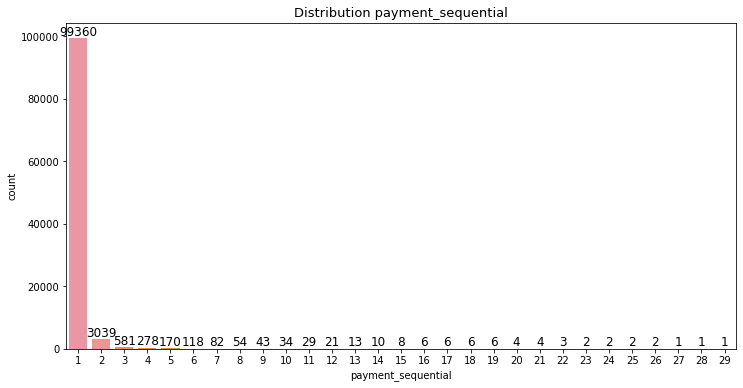

In [24]:
labels =sorted(payments_dataset['payment_sequential'].unique().tolist())

# Distribution de variable payment_installments

fig,ax=plt.subplots(figsize=(12,6))
sns.countplot(x = payments_dataset['payment_sequential'], order=labels)
plt.title('Distribution payment_sequential',fontsize=13)
plt.xlabel('payment_sequential')
for container in ax.containers:
    ax.bar_label(container,size=12,fmt='%.0f')

In [25]:
# Nombre de commandes cumulant 2 ou plus paiements
payments_dataset.loc[payments_dataset['payment_sequential']==19]['order_id'].nunique()

6

In [26]:
payments_dataset['payment_value'].sum()

16008872.12

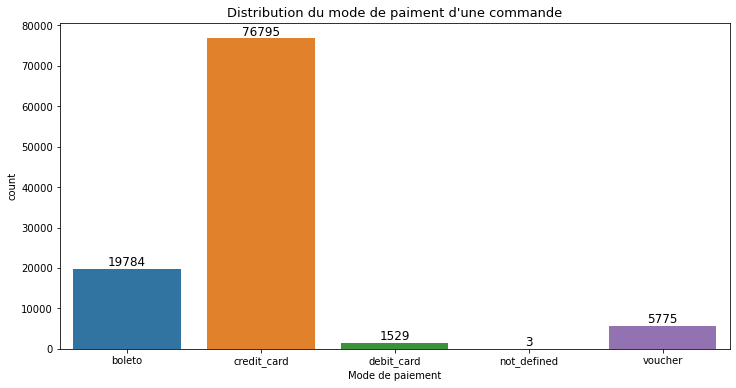

In [27]:
labels =sorted(payments_dataset['payment_type'].unique().tolist())

# Distribution de variable payment_installments

fig,ax=plt.subplots(figsize=(12,6))
sns.countplot(x = payments_dataset['payment_type'], order=labels)
plt.title("Distribution du mode de paiment d'une commande",fontsize=13)
plt.xlabel('Mode de paiement')
for container in ax.containers:
    ax.bar_label(container,size=12,fmt='%.0f')

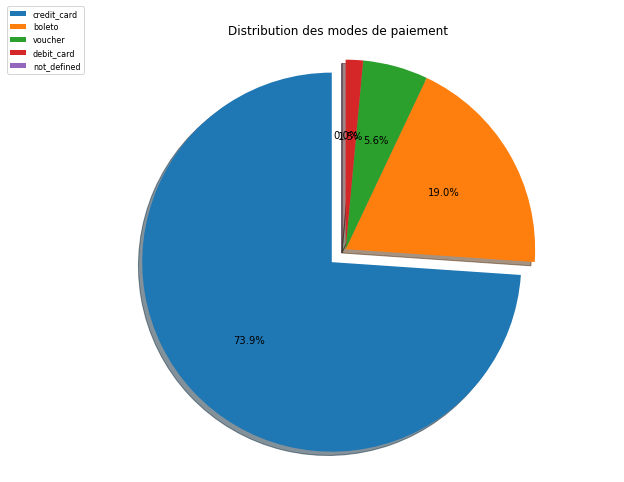

In [28]:
# Distribution des modes de paiements
labels =payments_dataset['payment_type'].value_counts(normalize=True).sort_values(ascending=False).index
values =payments_dataset['payment_type'].value_counts(normalize=True).sort_values(ascending=False).values
explode = (0.1, 0, 0, 0,0)  
# Diagramme en secteurs

fig1,ax1=plt.subplots(figsize=(10,8))
ax1.pie(values, 
        #labels=labels, 
        explode=explode,autopct='%1.1f%%', shadow=True, startangle=90)

ax1.axis('equal')   

plt.legend(labels, loc='center left', bbox_to_anchor=(-0.1, 1.),fontsize=8)
plt.title("Distribution des modes de paiement")
plt.show()

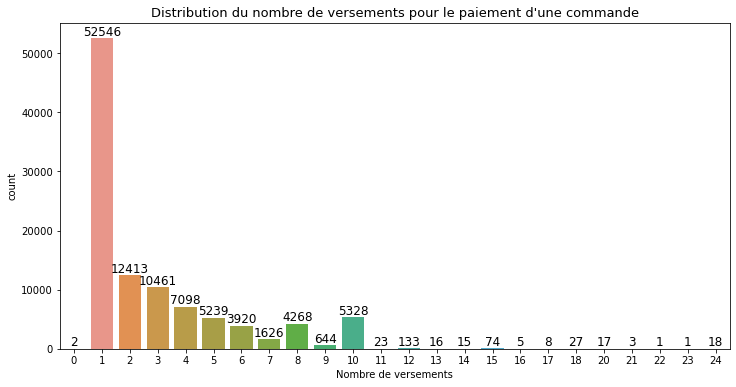

In [29]:
# Distribution de variable payment_installments
labels =sorted(payments_dataset['payment_installments'].unique().tolist())
fig,ax=plt.subplots(figsize=(12,6))
sns.countplot(x = payments_dataset['payment_installments'], order=labels)
plt.title("Distribution du nombre de versements pour le paiement d'une commande",fontsize=13)
plt.xlabel('Nombre de versements')
for container in ax.containers:
    ax.bar_label(container,size=12,fmt='%.0f')

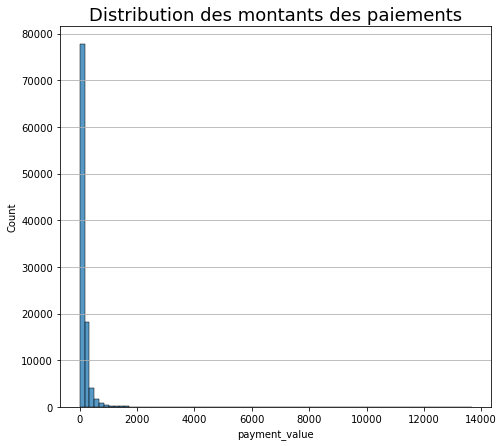

In [30]:
# Distribution des montants de paiments
fig=plt.figure(figsize = (17,7))

ax = fig.add_subplot(1,2, 1)
sns.histplot(x=payments_dataset['payment_value'],bins=80,)
ax.set_title("Distribution des montants des paiements", fontsize=18)
plt.grid(axis='y')


**Conclusion sur le fichier des paiements olist_order_payments_dataset**

Le fichier comporte 103.886 lignes, chaque ligne est un paiment.

Le fichier comporte 5 colonnes : l'identification de la commande, le numéro du paiements effectués sur la commande (cas de plusieurs paiements sur une même commande), le mode de paiement, le nombre de versements et le montant payé.

Le fichier ne comporte par de valeur manquante.

Le fichier comporte 99.440 commandes uniques. Il y a plusieurs paiements par commande.
Le nombre de paiements (payment_sequential)sur une même commande varie de 1 à 29, il est de 1 dans plus de 97% des cas, et 3.039 commandes sur 99.440 cumulent 2 modes de paiments ou plus.
Si le client cumule plusieurs modes de paiement sur une même commande, payment_sequential sera supérieur ou égal à 2 et dans ce cas, nous aurons plusieurs paiements associés la même commande.

En moyenne et dans plus de 50 % des paiements, les clients payent en 1 fois mais ils peuvent payer en 1 à 24 fois : environ 12% pour les paiements en 2 fois, 10% pour les paiements en 3 fois, 5% pour les paiments en 10 fois.

Près de 74% des paiements sont réalisés avec carte de crédit et 19% en espèces.

Le montant d'une ligne de paiment varie de 0 à 13.600€, il est en moyenne de 154€ et dans 75% des paiments, il est inférieur à 170€.

# <a name="C5">5. Fichier des avis clients: olist_order_reviews_dataset</a>

In [31]:
#Lecture et affichage du fichier 'olist_order_reviews_dataset '
reviews_dataset=pd.read_csv('olist_order_reviews_dataset.csv')
reviews_dataset

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53
...,...,...,...,...,...,...,...
99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,5,NaN,NaN,2018-07-07 00:00:00,2018-07-14 17:18:30
99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,5,NaN,NaN,2017-12-09 00:00:00,2017-12-11 20:06:42
99221,b3de70c89b1510c4cd3d0649fd302472,55d4004744368f5571d1f590031933e4,5,NaN,"Excelente mochila, entrega super rápida. Super...",2018-03-22 00:00:00,2018-03-23 09:10:43
99222,1adeb9d84d72fe4e337617733eb85149,7725825d039fc1f0ceb7635e3f7d9206,4,NaN,NaN,2018-07-01 00:00:00,2018-07-02 12:59:13


In [32]:
reviews_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   review_id                99224 non-null  object
 1   order_id                 99224 non-null  object
 2   review_score             99224 non-null  int64 
 3   review_comment_title     11568 non-null  object
 4   review_comment_message   40977 non-null  object
 5   review_creation_date     99224 non-null  object
 6   review_answer_timestamp  99224 non-null  object
dtypes: int64(1), object(6)
memory usage: 5.3+ MB


In [33]:
# Remplissage du jeu de données en % du nombre total de données
(1-round(reviews_dataset.isna().mean().mean(),3))*100

79.0

<AxesSubplot:>

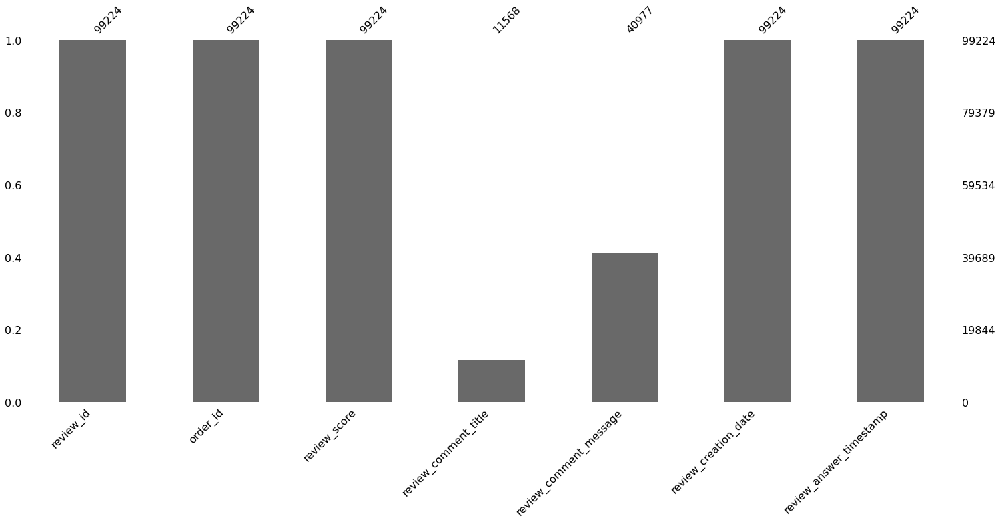

In [34]:
# Représentation du taux de remplissage du fichier
msno.bar(reviews_dataset)

In [35]:
reviews_dataset['review_id'].nunique()

98410

In [36]:
# Recherche de doublons sur les commandes (order_id)
reviews_dataset.loc[(reviews_dataset['order_id'].duplicated(keep=False))].sort_values(by='order_id',ascending=False)

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
53962,5476dd0eaee7c4e2725cafb011aa758c,ffaabba06c9d293a3c614e0515ddbabc,3,NaN,NaN,2017-12-20 00:00:00,2017-12-21 13:24:55
92230,870d856a4873d3a67252b0c51d79b950,ffaabba06c9d293a3c614e0515ddbabc,3,NaN,NaN,2017-12-20 00:00:00,2017-12-20 18:50:16
41355,39de8ad3a1a494fc68cc2d5382f052f4,ff850ba359507b996e8b2fbb26df8d03,5,NaN,Envio rapido... Produto 100%,2017-08-16 00:00:00,2017-08-17 11:56:55
18783,80f25f32c00540d49d57796fb6658535,ff850ba359507b996e8b2fbb26df8d03,5,NaN,"Envio rapido, produto conforme descrito no anu...",2017-08-22 00:00:00,2017-08-25 11:40:22
94504,c56a88a404315a0d9e412c1472dda2c4,ff763b73e473d03c321bcd5a053316e8,5,NaN,NaN,2017-11-01 00:00:00,2017-11-01 19:55:52
...,...,...,...,...,...,...,...
854,830636803620cdf8b6ffaf1b2f6e92b2,0176a6846bcb3b0d3aa3116a9a768597,5,NaN,NaN,2017-12-30 00:00:00,2018-01-02 10:54:06
22779,ab30810c29da5da8045216f0f62652a2,013056cfe49763c6f66bda03396c5ee3,5,NaN,NaN,2018-02-22 00:00:00,2018-02-23 12:12:30
68633,73413b847f63e02bc752b364f6d05ee9,013056cfe49763c6f66bda03396c5ee3,4,NaN,NaN,2018-03-04 00:00:00,2018-03-05 17:02:00
25612,89a02c45c340aeeb1354a24e7d4b2c1e,0035246a40f520710769010f752e7507,5,NaN,NaN,2017-08-29 00:00:00,2017-08-30 01:59:12


1.098 reviews sont associées à 2 (ou plus) même commande.

In [37]:
# supression des reviews qui sont associées à une même commandes
reviews_dataset.drop_duplicates(['order_id'],keep=False, inplace=True)

In [38]:
reviews_dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 98126 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   review_id                98126 non-null  object
 1   order_id                 98126 non-null  object
 2   review_score             98126 non-null  int64 
 3   review_comment_title     11534 non-null  object
 4   review_comment_message   40592 non-null  object
 5   review_creation_date     98126 non-null  object
 6   review_answer_timestamp  98126 non-null  object
dtypes: int64(1), object(6)
memory usage: 6.0+ MB


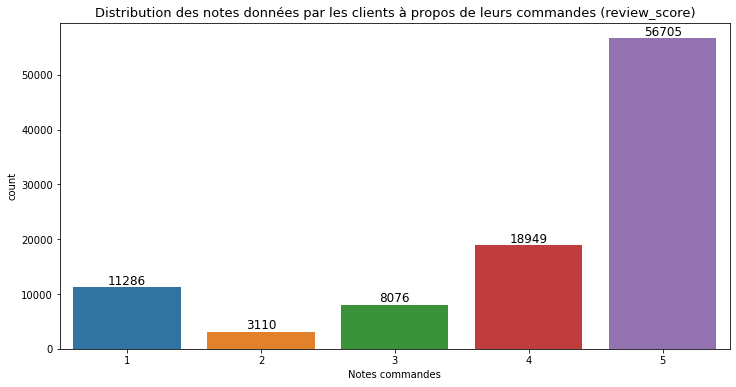

In [39]:
# Distribution de la variable review_score

fig,ax=plt.subplots(figsize=(12,6))
sns.countplot(x = reviews_dataset['review_score'], order=[1,2,3,4,5])
plt.title("Distribution des notes données par les clients à propos de leurs commandes (review_score)",fontsize=13)
plt.xlabel('Notes commandes')
for container in ax.containers:
    ax.bar_label(container,size=12,fmt='%.0f')

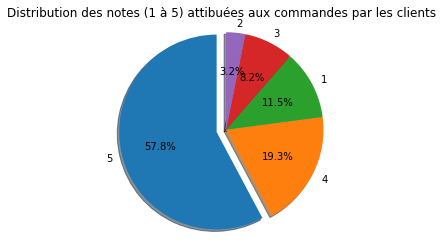

In [40]:
labels =reviews_dataset['review_score'].value_counts(normalize=True).sort_values(ascending=False).index
values =reviews_dataset['review_score'].value_counts(normalize=True).sort_values(ascending=False).values
explode = (0.1, 0, 0, 0,0)  
# Diagramme en secteurs

fig1, ax1 = plt.subplots()
ax1.pie(values, labels=labels, explode=explode,autopct='%1.1f%%', shadow=True, startangle=90)
ax1.axis('equal')   
plt.title("Distribution des notes (1 à 5) attibuées aux commandes par les clients")
plt.show()

**Conclusion du le fichier 'olist_order_reviews_dataset.csv'**

Le fichier omporte 99.224 lignes, chaque ligne est une review client (commentaire de satisfaction). 
Chaque review comporte au moins un note allant de 1 à 5.

40% des reviews comportent aussi un texte et 12% comporte en plus un titre.

Chaque review comporte une date de création par le vendeur et un date de réponse par le client. Ces 2 dates sont repmlies à 100%.
Certaines commandes ont plusieurs reviews, parfois avec des notes différentes, laquelle prendre en compte ? Cela concerne 1098 reviews. 
Nous faisons le choix de supprimer ces reviews.

Près de 58% des reviews ont une note de 5/5 et plus de 19% une de 4/5.
Moins de 15% de clients ne sont pas satisfaits ( note de 1 ou 2 sur 5).

# <a name="C6">6. Fichier des commandes : olist_orders_dataset</a>

In [41]:
#Lecture et affichage du fichier 'olist_orders_dataset '
orders_dataset=pd.read_csv('olist_orders_dataset.csv')
orders_dataset

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00
...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28 00:00:00
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02 00:00:00
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27 00:00:00
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15 00:00:00


In [42]:
# Nombre de commandes uniques
orders_dataset['order_id'].nunique()

99441

In [43]:
# Remplissage du jeu de données en % du nombre total de données
(1-round(orders_dataset.isna().mean().mean(),3))*100

99.4

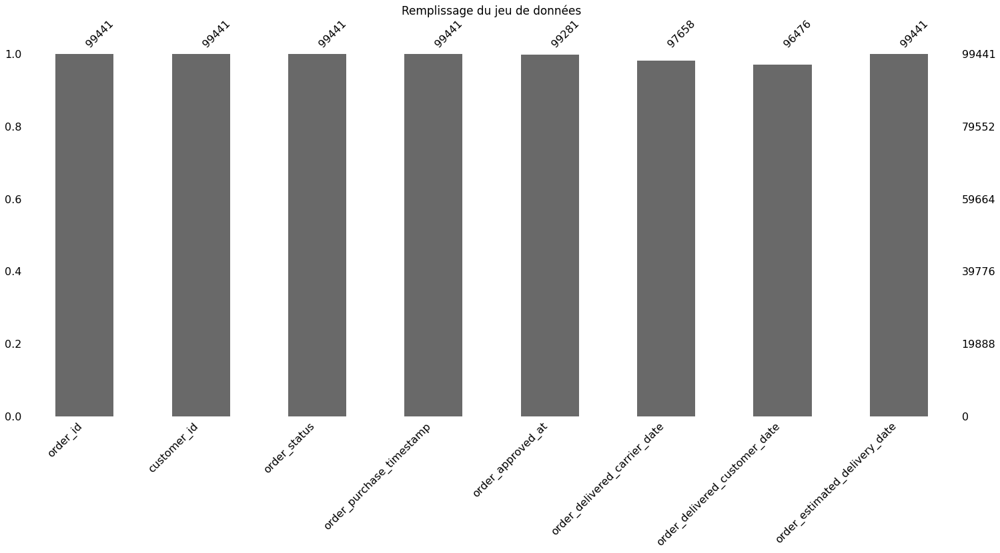

In [44]:
# Représentation du remplissage du jeu de données
msno.bar(orders_dataset)
plt.title('Remplissage du jeu de données',fontsize=17);

In [45]:
# Description statistique des données
orders_dataset.describe()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
count,99441,99441,99441,99441,99281,97658,96476,99441
unique,99441,99441,8,98875,90733,81018,95664,459
top,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2018-04-11 10:48:14,2018-02-27 04:31:10,2018-05-09 15:48:00,2018-05-08 23:38:46,2017-12-20 00:00:00
freq,1,1,96478,3,9,47,3,522


In [46]:
#Affichage du type des données
orders_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


In [47]:
# Conversion des champs correspondant à des dates au format 'datetime'
orders_dataset['order_purchase_timestamp'] = orders_dataset['order_purchase_timestamp'].astype('datetime64')
orders_dataset['order_approved_at'] = pd.to_datetime(orders_dataset['order_approved_at'])
orders_dataset['order_delivered_carrier_date'] = pd.to_datetime(orders_dataset['order_delivered_carrier_date'])
orders_dataset['order_delivered_customer_date'] = pd.to_datetime(orders_dataset['order_delivered_customer_date'])
orders_dataset['order_estimated_delivery_date'] = pd.to_datetime(orders_dataset['order_estimated_delivery_date'])

In [48]:
# vérification des types après conversion
orders_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       99441 non-null  object        
 1   customer_id                    99441 non-null  object        
 2   order_status                   99441 non-null  object        
 3   order_purchase_timestamp       99441 non-null  datetime64[ns]
 4   order_approved_at              99281 non-null  datetime64[ns]
 5   order_delivered_carrier_date   97658 non-null  datetime64[ns]
 6   order_delivered_customer_date  96476 non-null  datetime64[ns]
 7   order_estimated_delivery_date  99441 non-null  datetime64[ns]
dtypes: datetime64[ns](5), object(3)
memory usage: 6.1+ MB


In [49]:
# Quel est l'intervalle de valeurs prises par la date de commande ? 
orders_dataset['order_purchase_timestamp'].describe(datetime_is_numeric=True)

count                            99441
mean     2017-12-31 08:43:12.776581120
min                2016-09-04 21:15:19
25%                2017-09-12 14:46:19
50%                2018-01-18 23:04:36
75%                2018-05-04 15:42:16
max                2018-10-17 17:30:18
Name: order_purchase_timestamp, dtype: object

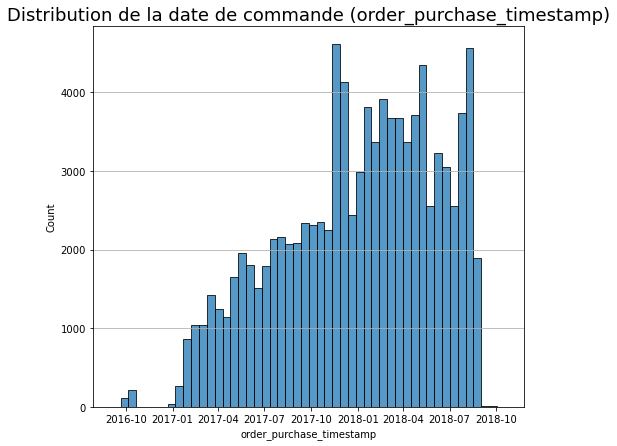

In [50]:
# Distribution des dates de commandes
fig=plt.figure(figsize = (17,7))

ax = fig.add_subplot(1,2, 1)
sns.histplot(x=orders_dataset['order_purchase_timestamp'],bins=50,)
ax.set_title("Distribution de la date de commande (order_purchase_timestamp)", fontsize=18)
plt.grid(axis='y')

In [51]:
# Observations des valeurs uniques prises par les variables catégorielles
print('OBSERVATIONS DES VALEURS PRISES PAR LA VARIABLE CATEGORIELLE "order_status" :\n\n' 
      + str(orders_dataset['order_status'].unique().tolist()))

OBSERVATIONS DES VALEURS PRISES PAR LA VARIABLE CATEGORIELLE "order_status" :

['delivered', 'invoiced', 'shipped', 'processing', 'unavailable', 'canceled', 'created', 'approved']


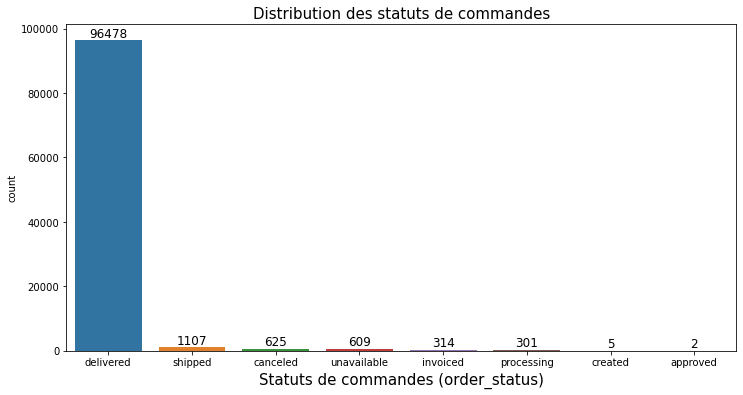

In [52]:
# Distribution de la variable statut de commande (order_status)
labels =orders_dataset['order_status'].value_counts(normalize=True).sort_values(ascending=False).head(10).index
fig,ax=plt.subplots(figsize=(12,6))
sns.countplot(x = orders_dataset['order_status'], order=labels)
plt.title("Distribution des statuts de commandes",fontsize=15)
plt.xlabel('Statuts de commandes (order_status)',fontsize=15)
for container in ax.containers:
    ax.bar_label(container,size=12,fmt='%.0f')

**Conslusion sur le fichier 'olist_orders_dataset '**

Le fichier comporte de 99.441 lignes, chaque ligne est une commande avec un numéro de commande unique order_id.
Chaque commande est associé à un numéro client propre à la commande, client customer_id ( qui est différent de l'identifiant client unique).

Le fichier est rempli à 99,4%, les valeurs manquantes concernent les différentes dates.

Les différentes dates (date achat, date d'approbation de commande, date de prise en charge de la commande par le transporteur, date de recepetion de la commande par le client, date de livraison annoncée au client à la commande) sont de type object. Nous les convertissons au format date pour pouvoir les exploiter ultérieurement.

Les dates d'achat s'étendent du 04 septmebre 2016 au 17 octobre 2018.

La variable catégorielle order_status peut prendre 8 status différents : pour 97 % des commandes, le statut de la commande est "delivered".

# <a name="C7">7. Fichier des produits : olist_products_dataset</a>

In [53]:
#Lecture et affichage du fichier 'olist_products_dataset '
products_dataset=pd.read_csv('olist_products_dataset.csv')
products_dataset

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0
...,...,...,...,...,...,...,...,...,...
32946,a0b7d5a992ccda646f2d34e418fff5a0,moveis_decoracao,45.0,67.0,2.0,12300.0,40.0,40.0,40.0
32947,bf4538d88321d0fd4412a93c974510e6,construcao_ferramentas_iluminacao,41.0,971.0,1.0,1700.0,16.0,19.0,16.0
32948,9a7c6041fa9592d9d9ef6cfe62a71f8c,cama_mesa_banho,50.0,799.0,1.0,1400.0,27.0,7.0,27.0
32949,83808703fc0706a22e264b9d75f04a2e,informatica_acessorios,60.0,156.0,2.0,700.0,31.0,13.0,20.0


In [54]:
# Remplissage du jeu de données en % du nombre total de données
(1-round(products_dataset.isna().mean().mean(),3))*100

99.2

In [55]:
products_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32341 non-null  object 
 2   product_name_lenght         32341 non-null  float64
 3   product_description_lenght  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.3+ MB


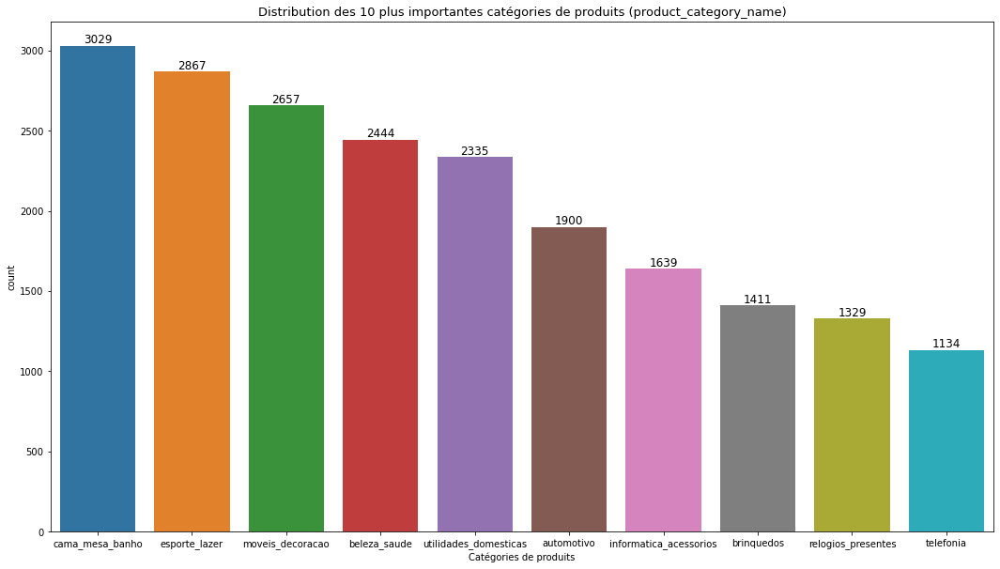

In [56]:
labels =products_dataset['product_category_name'].value_counts(normalize=True).sort_values(ascending=False).head(10).index

# Distribution de la catégorie de produits ( product_category_name)

fig,ax=plt.subplots(figsize=(18,10))
sns.countplot(x = products_dataset['product_category_name'], order=labels)
plt.title("Distribution des 10 plus importantes catégories de produits (product_category_name)",fontsize=13)
plt.xlabel('Catégories de produits')
for container in ax.containers:
    ax.bar_label(container,size=12,fmt='%.0f')

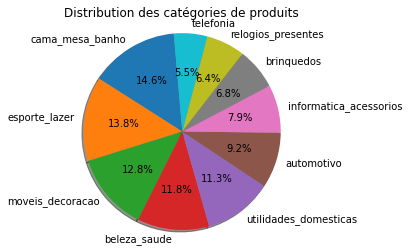

In [57]:
# Distribution des la catégorie de produits ( diagramme en secteurs)
labels =products_dataset['product_category_name'].value_counts(normalize=True).sort_values(ascending=False).head(10).index
values =products_dataset['product_category_name'].value_counts(normalize=True).sort_values(ascending=False).head(10).values

products_dataset_2=products_dataset['product_category_name']
# Diagramme en secteurs

fig1, ax1 = plt.subplots()
ax1.pie(values, labels=labels, autopct='%1.1f%%', shadow=True, startangle=95)

#Cette ligne assure que le pie chart est un cercle plutôt qu'une éllipse
ax1.axis('equal')   
plt.title('Distribution des catégories de produits')
plt.show()

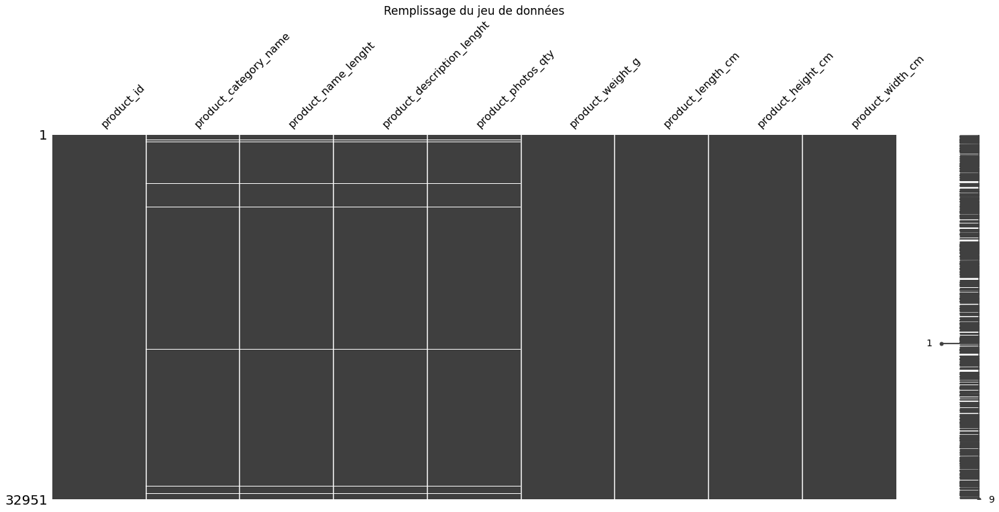

In [58]:
# Représentation du remplissage du jeu de données
msno.matrix(products_dataset)
plt.title('Remplissage du jeu de données',fontsize=17);

In [59]:
# Observations des valeurs uniques prises par les variables catégorielles
print('VALEURS UNIQUES PRISES PAR LA VARIABLE CATEGORIELLE "product_category_name" : \n' )
print( str(products_dataset['product_category_name'].unique().tolist())+'\n')
print( "Nombre de valeurs uniques : "+str(products_dataset['product_category_name'].nunique())+'\n')


VALEURS UNIQUES PRISES PAR LA VARIABLE CATEGORIELLE "product_category_name" : 

['perfumaria', 'artes', 'esporte_lazer', 'bebes', 'utilidades_domesticas', 'instrumentos_musicais', 'cool_stuff', 'moveis_decoracao', 'eletrodomesticos', 'brinquedos', 'cama_mesa_banho', 'construcao_ferramentas_seguranca', 'informatica_acessorios', 'beleza_saude', 'malas_acessorios', 'ferramentas_jardim', 'moveis_escritorio', 'automotivo', 'eletronicos', 'fashion_calcados', 'telefonia', 'papelaria', 'fashion_bolsas_e_acessorios', 'pcs', 'casa_construcao', 'relogios_presentes', 'construcao_ferramentas_construcao', 'pet_shop', 'eletroportateis', 'agro_industria_e_comercio', nan, 'moveis_sala', 'sinalizacao_e_seguranca', 'climatizacao', 'consoles_games', 'livros_interesse_geral', 'construcao_ferramentas_ferramentas', 'fashion_underwear_e_moda_praia', 'fashion_roupa_masculina', 'moveis_cozinha_area_de_servico_jantar_e_jardim', 'industria_comercio_e_negocios', 'telefonia_fixa', 'construcao_ferramentas_iluminacao

## product_category_name_translation

In [60]:
#Lecture et affichage du fichier 'product_category_name_translation '
data_categ_name_transl=pd.read_csv('product_category_name_translation.csv')
data_categ_name_transl

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor
...,...,...
66,flores,flowers
67,artes_e_artesanato,arts_and_craftmanship
68,fraldas_higiene,diapers_and_hygiene
69,fashion_roupa_infanto_juvenil,fashion_childrens_clothes


Fichier des traductions portugais vers anglais des catégories de produits.

# <a name="C8">8. Feature engineering </a>
## Feature engineering RFM (Recency, Fequency, Monetary)
L'objectif est de créer un fichier de clients uniques avec la récence, la fréquence et le montant d'achat du client.
### Jointures

In [61]:
# Jointure du dataset clients avec le dataset des commandes. Merge à gauche
orders_customer_merge=pd.merge(orders_dataset,customer_dataset,left_on='customer_id',right_on='customer_id',how='left')
orders_customer_merge

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,af07308b275d755c9edb36a90c618231,47813,barreiras,BA
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP
...,...,...,...,...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28,6359f309b166b0196dbf7ad2ac62bb5a,12209,sao jose dos campos,SP
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,da62f9e57a76d978d02ab5362c509660,11722,praia grande,SP
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,737520a9aad80b3fbbdad19b66b37b30,45920,nova vicosa,BA
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,5097a5312c8b157bb7be58ae360ef43c,28685,japuiba,RJ


In [62]:
# Montant payé pour une commande.Si plusieurs paiements sur une même commande(c'est à dire si payment_sequential>=2), 
# on somme les différents paiements trouvé
grouped_payments_dataset=payments_dataset.groupby(['order_id']).agg({'payment_value': 'sum'})
grouped_payments_dataset

,payment_value
order_id,
00010242fe8c5a6d1ba2dd792cb16214,72.19
00018f77f2f0320c557190d7a144bdd3,259.83
000229ec398224ef6ca0657da4fc703e,216.87
00024acbcdf0a6daa1e931b038114c75,25.78
00042b26cf59d7ce69dfabb4e55b4fd9,218.04
...,...
fffc94f6ce00a00581880bf54a75a037,343.40
fffcd46ef2263f404302a634eb57f7eb,386.53
fffce4705a9662cd70adb13d4a31832d,116.85


In [63]:
grouped_payments_dataset.sum()

payment_value    16008872.12
dtype: float64

On obtient une ligne de moins (une commande de moins) que dans notre fichier de commandes, cela signifie qu'il y a une commande sans montant de paiement.

In [64]:
#jointure du montant payé à la commande avec le dataset des commandes et de clients
data_1=pd.merge(orders_customer_merge,grouped_payments_dataset,left_on='order_id',right_on='order_id',how='left')
data_1

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,payment_value
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,38.71
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,141.46
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,179.12
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN,72.20
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP,28.62
...,...,...,...,...,...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28,6359f309b166b0196dbf7ad2ac62bb5a,12209,sao jose dos campos,SP,85.08
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,da62f9e57a76d978d02ab5362c509660,11722,praia grande,SP,195.00
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,737520a9aad80b3fbbdad19b66b37b30,45920,nova vicosa,BA,271.01
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,5097a5312c8b157bb7be58ae360ef43c,28685,japuiba,RJ,441.16


In [65]:
# Vérification du montant total de commande
data_1['payment_value'].sum()

16008872.120000001

In [66]:
#Identification des commandes ayant un statut autre que "livrée" 
data_1.loc[~(data_1['order_status']=='delivered')]


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,payment_value
6,136cce7faa42fdb2cefd53fdc79a6098,ed0271e0b7da060a393796590e7b737a,invoiced,2017-04-11 12:22:08,2017-04-13 13:25:17,NaT,NaT,2017-05-09,36edbb3fb164b1f16485364b6fb04c73,98900,santa rosa,RS,65.95
44,ee64d42b8cf066f35eac1cf57de1aa85,caded193e8e47b8362864762a83db3c5,shipped,2018-06-04 16:44:48,2018-06-05 04:31:18,2018-06-05 14:32:00,NaT,2018-06-28,08fb46d35bb3ab4037202c23592d1259,13215,jundiai,SP,22.36
103,0760a852e4e9d89eb77bf631eaaf1c84,d2a79636084590b7465af8ab374a8cf5,invoiced,2018-08-03 17:44:42,2018-08-07 06:15:14,NaT,NaT,2018-08-21,c7f8d7b1fffc946d7069574f74c39f4e,88140,santo amaro da imperatriz,SC,50.35
128,15bed8e2fec7fdbadb186b57c46c92f2,f3f0e613e0bdb9c7cee75504f0f90679,processing,2017-09-03 14:22:03,2017-09-03 14:30:09,NaT,NaT,2017-10-03,9f269af9c49244f6ba4a46985a3cfc2e,3436,sao paulo,SP,138.28
154,6942b8da583c2f9957e990d028607019,52006a9383bf149a4fb24226b173106f,shipped,2018-01-10 11:33:07,2018-01-11 02:32:30,2018-01-11 19:39:23,NaT,2018-02-07,528b011eb7fab3d59c336cc7248eed3a,38600,paracatu,MG,69.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...
99283,3a3cddda5a7c27851bd96c3313412840,0b0d6095c5555fe083844281f6b093bb,canceled,2018-08-31 16:13:44,NaT,NaT,NaT,2018-10-01,e90598185d2427a35e32ef241a5c04aa,11075,santos,SP,63.89
99313,e9e64a17afa9653aacf2616d94c005b8,b4cd0522e632e481f8eaf766a2646e86,processing,2018-01-05 23:07:24,2018-01-09 07:18:05,NaT,NaT,2018-02-06,965191786b70912f793e4a777fd623cd,13050,campinas,SP,144.56
99347,a89abace0dcc01eeb267a9660b5ac126,2f0524a7b1b3845a1a57fcf3910c4333,canceled,2018-09-06 18:45:47,NaT,NaT,NaT,2018-09-27,d05c44a138277ad325d915c6b7ccbcdf,5344,sao paulo,SP,107.13
99348,a69ba794cc7deb415c3e15a0a3877e69,726f0894b5becdf952ea537d5266e543,unavailable,2017-08-23 16:28:04,2017-08-28 15:44:47,NaT,NaT,2017-09-15,e72a90a2b29fe1a8795b284aaaa3246f,22723,rio de janeiro,RJ,195.91


In [67]:
#Filtrage sur les commandes livrées uniquement
data_1=data_1.loc[data_1['order_status']=='delivered']
data_1

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,payment_value
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,38.71
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,141.46
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,179.12
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN,72.20
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP,28.62
...,...,...,...,...,...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28,6359f309b166b0196dbf7ad2ac62bb5a,12209,sao jose dos campos,SP,85.08
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,da62f9e57a76d978d02ab5362c509660,11722,praia grande,SP,195.00
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,737520a9aad80b3fbbdad19b66b37b30,45920,nova vicosa,BA,271.01
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,5097a5312c8b157bb7be58ae360ef43c,28685,japuiba,RJ,441.16


In [68]:
# Vérification du montant total de commande
data_1['payment_value'].sum()

15422461.769999998

In [69]:
# Identification de la commande sans montant de paiement
data_1.loc[data_1['payment_value'].isna()]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,payment_value
30710,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04,830d5b7aaa3b6f1e9ad63703bec97d23,14600,sao joaquim da barra,SP,NaN


### Création des features RFM ( Recency / Frequency / Monetary)

In [70]:
# Pour une meilleur lisibilité on se place au lendemain de la date d'achat la plus récente qui est le 17/10/2018
NOW = data_1['order_purchase_timestamp'].max() + timedelta(days=1)
NOW

Timestamp('2018-08-30 15:00:37')

In [71]:
# Création de la colonne DaysSinceOrder : nombre de jours depuis la commande
data_1['DaysSinceOrder'] = data_1['order_purchase_timestamp'].apply(lambda x: (NOW - x).days)
data_1

C:\Users\Léa Zadikian\AppData\Local\Temp\ipykernel_9972\3640037836.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_1['DaysSinceOrder'] = data_1['order_purchase_timestamp'].apply(lambda x: (NOW - x).days)


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,payment_value,DaysSinceOrder
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,38.71,332
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,141.46,36
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,179.12,22
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN,72.20,284
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP,28.62,197
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28,6359f309b166b0196dbf7ad2ac62bb5a,12209,sao jose dos campos,SP,85.08,539
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,da62f9e57a76d978d02ab5362c509660,11722,praia grande,SP,195.00,205
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,737520a9aad80b3fbbdad19b66b37b30,45920,nova vicosa,BA,271.01,368
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,5097a5312c8b157bb7be58ae360ef43c,28685,japuiba,RJ,441.16,233


In [72]:
# Nombre de clients uniques
data_1['customer_unique_id'].nunique()

93358

In [73]:
#fonction d'aggrégation du groupby
aggr = {
    'DaysSinceOrder': lambda x: x.min(), # Nombre de jours depuis la dernière commande (Recency/Recence)
    'order_id':lambda x :x.nunique(), #Nombre de commandes sur la période (Frequency / Fréquence)
    'payment_value':'sum' #Somme du montant de commandes (Monetary/Montant)
}

# Création du dataframe rfm qui regroupe par client (customer_unique_id) et contiendra les 3 features Recency, Frequency, Monetary
rfm = data_1.groupby('customer_unique_id').agg(aggr).reset_index()
rfm.rename(columns={'DaysSinceOrder': 'Recency', 'order_id': 'Frequency','payment_value':'Monetary'}, inplace=True)
rfm

,customer_unique_id,Recency,Frequency,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19
2,0000f46a3911fa3c0805444483337064,537,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89
...,...,...,...,...
93353,fffcf5a5ff07b0908bd4e2dbc735a684,447,1,2067.42
93354,fffea47cd6d3cc0a88bd621562a9d061,262,1,84.58
93355,ffff371b4d645b6ecea244b27531430a,568,1,112.46
93356,ffff5962728ec6157033ef9805bacc48,119,1,133.69


In [74]:
rfm.info() # Pas de valeur manquante

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93358 entries, 0 to 93357
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   customer_unique_id  93358 non-null  object 
 1   Recency             93358 non-null  int64  
 2   Frequency           93358 non-null  int64  
 3   Monetary            93358 non-null  float64
dtypes: float64(1), int64(2), object(1)
memory usage: 2.8+ MB


In [75]:
# Description statistique
rfm.describe()

,Recency,Frequency,Monetary
count,93358.000000,93358.000000,93358.000000
mean,237.941773,1.033420,165.197003
std,152.591453,0.209097,226.314012
min,1.000000,1.000000,0.000000
25%,114.000000,1.000000,63.052500
50%,219.000000,1.000000,107.780000
75%,346.000000,1.000000,182.557500
max,714.000000,15.000000,13664.080000


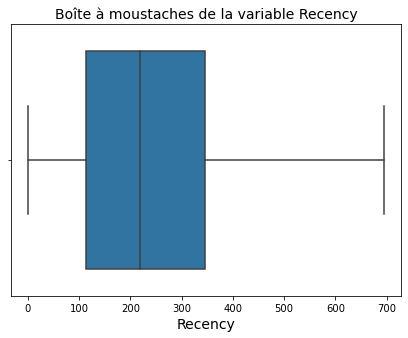

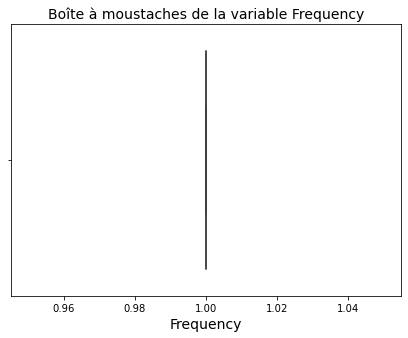

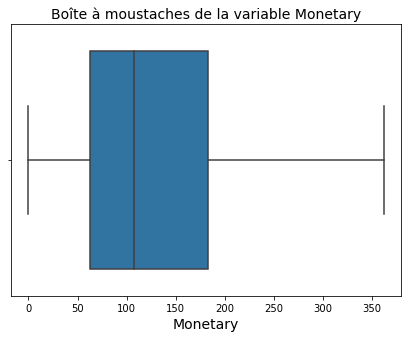

In [76]:
# Box plot des variables numériques RFM
for column in rfm.select_dtypes(exclude='object'):
    plt.figure(figsize = (7,5))
    sns.boxplot(x=rfm[column],showfliers=False)
    plt.title('Boîte à moustaches de la variable ' + column,fontsize=14)
    plt.xlabel(column,fontsize=14)
    plt.show()


In [77]:
# Controle de cohérence, vérification que le montant globale de commande reste le même
rfm['Monetary'].sum()

15422461.769999998

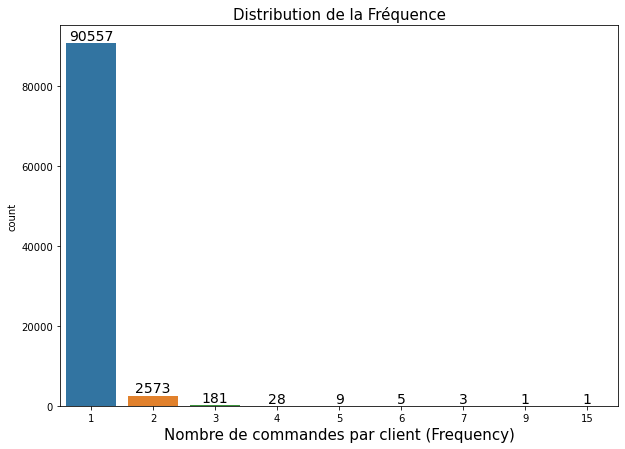

In [78]:
#Distribution du nombre de commandes par client
labels =sorted(rfm['Frequency'].unique().tolist())
fig,ax=plt.subplots(figsize=(10,7))
sns.countplot(x = rfm['Frequency'], order=labels)
plt.title("Distribution de la Fréquence",fontsize=15)
plt.xlabel('Nombre de commandes par client (Frequency)',fontsize=15)
for container in ax.containers:
    ax.bar_label(container,size=14,fmt='%.0f')

Près de 97% des clients ont passé une seule commande, un peu plus de 3% des clients ont passé de 2 à 17 commandes

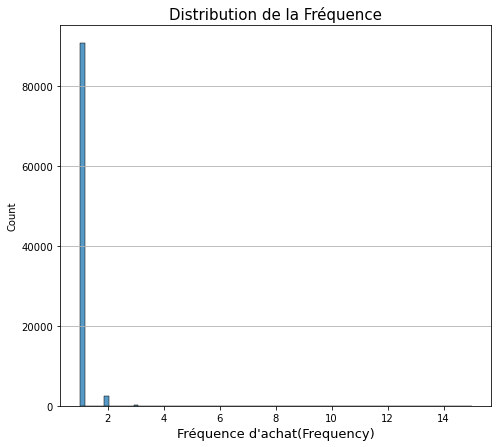

In [79]:
# Distribution du nombre de la fréquence d'achat
fig=plt.figure(figsize = (17,7))

ax = fig.add_subplot(1,2, 1)
sns.histplot(x=rfm['Frequency'],bins=80,)
ax.set_title("Distribution de la Fréquence", fontsize=15)
plt.xlabel("Fréquence d'achat(Frequency)",fontsize=13)
plt.grid(axis='y')

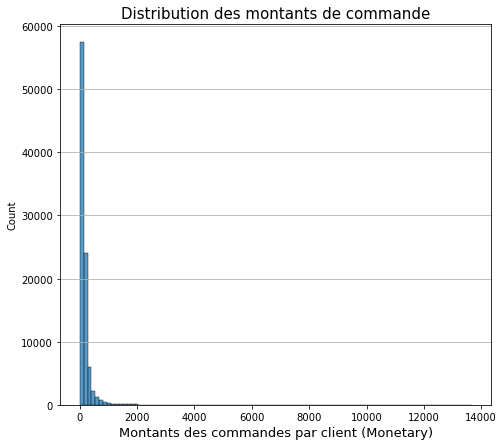

In [80]:
# Distribution des montants de commande par client
fig=plt.figure(figsize = (17,7))

ax = fig.add_subplot(1,2,1)
sns.histplot(x=rfm['Monetary'],bins=100,)
ax.set_title("Distribution des montants de commande", fontsize=15)
plt.xlabel('Montants des commandes par client (Monetary)',fontsize=13)
plt.grid(axis='y')

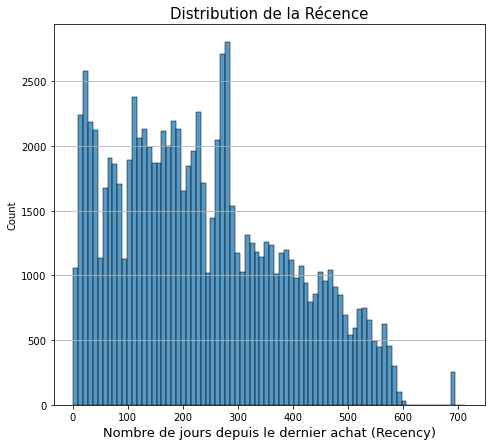

In [81]:
# Distribution du nombre de jour depuis le dernier achat
fig=plt.figure(figsize = (17,7))

ax = fig.add_subplot(1,2, 1)
sns.histplot(x=rfm['Recency'],bins=80,)
ax.set_title("Distribution de la Récence", fontsize=15)
plt.xlabel('Nombre de jours depuis le dernier achat (Recency)',fontsize=13)
plt.grid(axis='y')

In [82]:
fig = px.scatter_3d(rfm, x='Recency', y='Frequency', z='Monetary')
fig.show()

C:\Users\Léa Zadikian\AppData\Local\Temp\ipykernel_9972\1077112040.py:4: MatplotlibDeprecationWarning:

Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().



<Figure size 432x288 with 0 Axes>

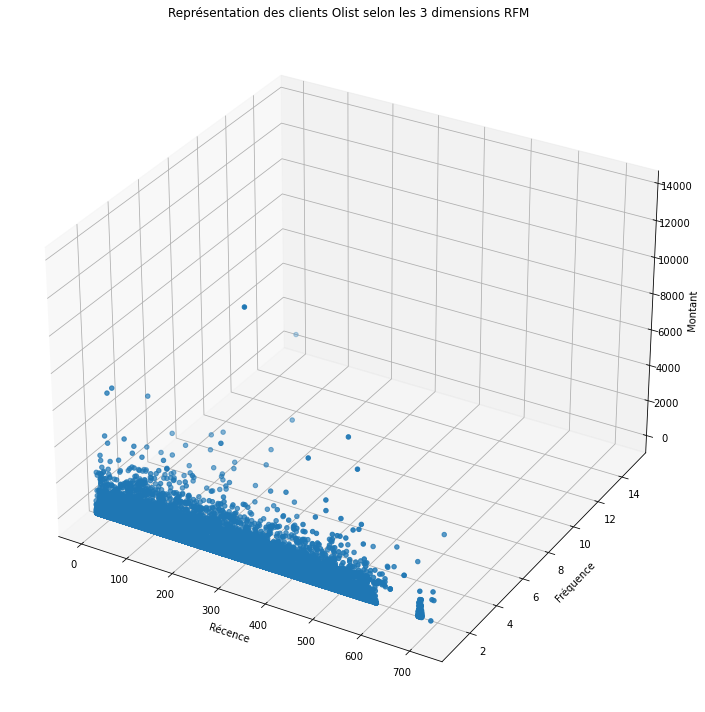

In [83]:
# Tracé du résultat en 3D
fig = plt.figure()
fig=plt.figure(figsize = (10,10))
ax = fig.gca(projection='3d')  # Affichage en 3D
ax.scatter( rfm['Recency'],rfm['Frequency'],rfm['Monetary'],label='Courbe', marker='o')  # Tracé des points 3D
plt.title("Représentation des clients Olist selon les 3 dimensions RFM")
ax.set_xlabel('Récence')
ax.set_ylabel('Fréquence')
ax.set_zlabel('Montant')
plt.tight_layout()
plt.show()

## Review Score
Nous allons rajouter le Review Score comme dimension d'analyse.
### Jointure

In [84]:
# Jointure de la table des review de commandes 'reviews_dataset'
data_2=pd.merge(data_1,reviews_dataset,left_on='order_id',right_on='order_id',how='left')
data_2

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,payment_value,DaysSinceOrder,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,38.71,332,a54f0611adc9ed256b57ede6b6eb5114,4.0,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,141.46,36,8d5266042046a06655c8db133d120ba5,4.0,Muito boa a loja,Muito bom o produto.,2018-08-08 00:00:00,2018-08-08 18:37:50
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,179.12,22,e73b67b67587f7644d5bd1a52deb1b01,5.0,NaN,NaN,2018-08-18 00:00:00,2018-08-22 19:07:58
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN,72.20,284,359d03e676b3c069f62cadba8dd3f6e8,5.0,NaN,O produto foi exatamente o que eu esperava e e...,2017-12-03 00:00:00,2017-12-05 19:21:58
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP,28.62,197,e50934924e227544ba8246aeb3770dd4,5.0,NaN,NaN,2018-02-17 00:00:00,2018-02-18 13:02:51
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96473,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28,6359f309b166b0196dbf7ad2ac62bb5a,12209,sao jose dos campos,SP,85.08,539,e262b3f92d1ce917aa412a9406cf61a6,5.0,NaN,NaN,2017-03-22 00:00:00,2017-03-23 11:02:08
96474,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,da62f9e57a76d978d02ab5362c509660,11722,praia grande,SP,195.00,205,29bb71b2760d0f876dfa178a76bc4734,4.0,NaN,So uma peça que veio rachado mas tudo bem rs,2018-03-01 00:00:00,2018-03-02 17:50:01
96475,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,737520a9aad80b3fbbdad19b66b37b30,45920,nova vicosa,BA,271.01,368,371579771219f6db2d830d50805977bb,5.0,NaN,Foi entregue antes do prazo.,2017-09-22 00:00:00,2017-09-22 23:10:57
96476,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,5097a5312c8b157bb7be58ae360ef43c,28685,japuiba,RJ,441.16,233,8ab6855b9fe9b812cd03a480a25058a1,2.0,NaN,Foi entregue somente 1. Quero saber do outro p...,2018-01-26 00:00:00,2018-01-27 09:16:56


In [85]:
data_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 96478 entries, 0 to 96477
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       96478 non-null  object        
 1   customer_id                    96478 non-null  object        
 2   order_status                   96478 non-null  object        
 3   order_purchase_timestamp       96478 non-null  datetime64[ns]
 4   order_approved_at              96464 non-null  datetime64[ns]
 5   order_delivered_carrier_date   96476 non-null  datetime64[ns]
 6   order_delivered_customer_date  96470 non-null  datetime64[ns]
 7   order_estimated_delivery_date  96478 non-null  datetime64[ns]
 8   customer_unique_id             96478 non-null  object        
 9   customer_zip_code_prefix       96478 non-null  int64         
 10  customer_city                  96478 non-null  object        
 11  customer_state 

In [86]:
# Recherche des valeurs uniques prises par la variable "review_score"
data_2['review_score'].unique()

array([ 4.,  5.,  1., nan,  2.,  3.])

In [87]:
# Identification des commandes sans review 
data_2.loc[data_2['review_score'].isna()]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,payment_value,DaysSinceOrder,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
15,403b97836b0c04a622354cf531062e5f,738b086814c6fcc74b8cc583f8516ee3,delivered,2018-01-02 19:00:43,2018-01-02 19:09:04,2018-01-03 18:19:09,2018-01-20 01:38:59,2018-02-06,6e26bbeaa107ec34112c64e1ee31c0f5,21381,rio de janeiro,RJ,1376.45,239,NaN,NaN,NaN,NaN,NaN,NaN
301,4906eeadde5f70b308c20c4a8f20be02,4e7656e34357b93f14b40c6400ca3f6e,delivered,2017-12-08 04:45:26,2017-12-12 03:50:30,2017-12-12 17:43:21,2018-01-09 18:04:58,2018-01-03,ea870f4fdfd85ac98ab775b76efe3143,23065,rio de janeiro,RJ,162.25,265,NaN,NaN,NaN,NaN,NaN,NaN
369,b7a4a9ecb1cd3ef6a3e36a48e200e3be,c3d8fc500d86b1c961ee144395c13a57,delivered,2017-05-19 18:13:54,2017-05-20 11:35:41,2017-05-30 12:43:50,2017-06-08 07:53:42,2017-06-16,367f4686d7112d69feed92b02a1775ed,88501,lages,SC,41.10,467,NaN,NaN,NaN,NaN,NaN,NaN
377,59b32faedc12322c672e95ec3716d614,5baa82a2c45fa3220cb57d9881db3211,delivered,2018-06-27 11:10:11,2018-06-28 02:15:51,2018-06-28 14:57:00,2018-07-06 16:37:36,2018-07-26,c56d066e503008b8d0bf4204857c588d,97110,santa maria,RS,87.58,64,NaN,NaN,NaN,NaN,NaN,NaN
391,ac7a92560a9e99f0a0ab4988102f491b,6abf781c5304890987047e9aa239caa8,delivered,2018-03-04 15:58:09,2018-03-04 16:10:35,2018-03-06 17:14:59,2018-03-22 23:44:33,2018-03-23,a176838867d89ed62981cdf02b7ca3e1,86040,londrina,PR,107.87,178,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96098,2fcdb0c004a2a538d3dd724ea76916bd,cf826be53b1fe4a39bc33c7f5f827835,delivered,2017-11-22 11:39:00,2017-11-22 11:49:05,2017-11-23 22:58:51,2017-12-15 00:23:25,2017-12-18,d92462d83762d5e5c112bccc344119e6,65940,grajau,MA,90.71,281,NaN,NaN,NaN,NaN,NaN,NaN
96131,dbfa3d8c05cc5d84083fc259a9feb5bc,92fc29e76e4da7c1b189ab092d4c3756,delivered,2018-01-04 22:57:14,2018-01-06 02:08:45,2018-01-13 00:51:54,2018-01-22 21:16:37,2018-02-01,8901b2526349d372dd0bdf8d77af656d,79823,dourados,MS,164.17,237,NaN,NaN,NaN,NaN,NaN,NaN
96182,2f2df159f26ddb73d55ee72372200d3e,86a7245fffe6a418ca1658a13ecc4531,delivered,2017-07-17 01:19:50,2017-07-17 01:30:09,2017-07-17 22:14:50,2017-07-26 09:44:00,2017-08-09,1d532194f005426adcdf6d969640d56e,35240,conselheiro pena,MG,166.81,409,NaN,NaN,NaN,NaN,NaN,NaN
96249,79ce3a0a9eba49ff442b392ab05349a4,3b979b88fbf88354add6870de52d007b,delivered,2017-12-12 23:41:30,2017-12-13 00:33:28,2017-12-13 17:53:38,2017-12-26 19:32:07,2018-01-09,3d4cd13fd525234c1c4a2304fbe769e0,2452,sao paulo,SP,87.64,260,NaN,NaN,NaN,NaN,NaN,NaN


**Résultat de la jointure :**
Certaines commandes n'ont pas de review ( 95.307 review_id pour 96.478 order_id).


In [88]:
# Exportation du dataset
data_2.to_csv('order_customer_review.csv', index=False)


### Création de la feature Review Score
Création d'un nouveau dataset rfm_rs (sur le même principe que le dataframe rfm créé précédement).
Les review scores sont agrégés par client en effectuant la moyenne des review scores attribués par un client à ses commandes.

In [89]:
#fonction d'aggrégation du groupby
aggr = {
    'DaysSinceOrder': lambda x: x.min(), # Nombre de jours depuis la dernière commande (Recency/Recence)
    'order_id':lambda x :x.nunique(), # Nombre de commandes passé par un client (Frequency / Fréquence)
    'payment_value':'sum', # Somme des montants des commandes passées par un client (Monetary/Montant)
    'review_score' : lambda x: round(x.mean(),0) # Moyenne des notes données par un client à ses commandes
}
# Création du dataframe rfm_rs qui regroupe par client unique (customer_unique_id) et contiendra les 3 features RFM + le review_score
rfm_rs = data_2.groupby('customer_unique_id').agg(aggr).reset_index()
rfm_rs.rename(columns={'DaysSinceOrder': 'Recency', 'order_id': 'Frequency','payment_value':'Monetary','review_score':'Review Score'}, inplace=True)
rfm_rs

,customer_unique_id,Recency,Frequency,Monetary,Review Score
0,0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90,5.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19,4.0
2,0000f46a3911fa3c0805444483337064,537,1,86.22,3.0
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,4.0
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,5.0
...,...,...,...,...,...
93353,fffcf5a5ff07b0908bd4e2dbc735a684,447,1,2067.42,5.0
93354,fffea47cd6d3cc0a88bd621562a9d061,262,1,84.58,4.0
93355,ffff371b4d645b6ecea244b27531430a,568,1,112.46,5.0
93356,ffff5962728ec6157033ef9805bacc48,119,1,133.69,5.0


In [90]:
rfm_rs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93358 entries, 0 to 93357
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   customer_unique_id  93358 non-null  object 
 1   Recency             93358 non-null  int64  
 2   Frequency           93358 non-null  int64  
 3   Monetary            93358 non-null  float64
 4   Review Score        92593 non-null  float64
dtypes: float64(2), int64(2), object(1)
memory usage: 3.6+ MB


In [91]:
# 765 clients sans review score, sur 93.358 clients, nous les supprimons.
rfm_rs.dropna(subset=['Review Score'], inplace=True)

In [92]:
rfm_rs.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 92593 entries, 0 to 93357
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   customer_unique_id  92593 non-null  object 
 1   Recency             92593 non-null  int64  
 2   Frequency           92593 non-null  int64  
 3   Monetary            92593 non-null  float64
 4   Review Score        92593 non-null  float64
dtypes: float64(2), int64(2), object(1)
memory usage: 4.2+ MB


In [93]:
rfm_rs.describe()

,Recency,Frequency,Monetary,Review Score
count,92593.000000,92593.000000,92593.000000,92593.000000
mean,237.672459,1.032810,164.930911,4.152873
std,152.612419,0.207907,225.121680,1.280820
min,1.000000,1.000000,0.000000,1.000000
25%,114.000000,1.000000,63.000000,4.000000
50%,219.000000,1.000000,107.780000,5.000000
75%,346.000000,1.000000,182.290000,5.000000
max,714.000000,15.000000,13664.080000,5.000000


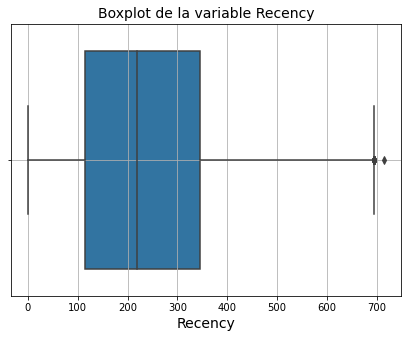

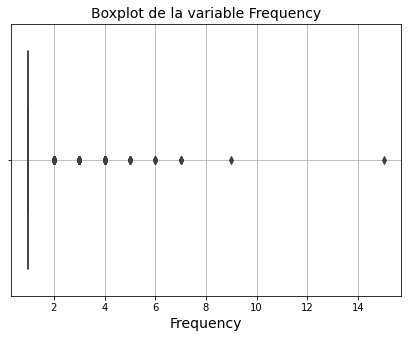

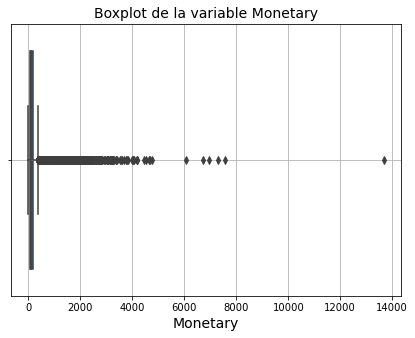

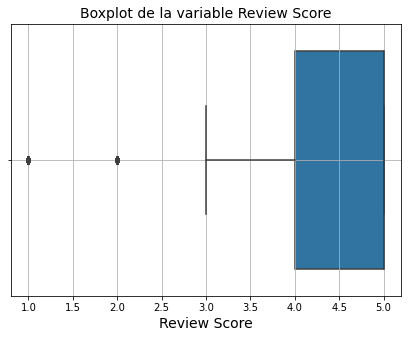

In [94]:
# Boxplot des variables numériques de dataframe RFM + RS
for column in rfm_rs.select_dtypes(exclude='object'):
    plt.figure(figsize = (7,5))
    sns.boxplot(x=rfm_rs[column],showfliers=True)
    plt.title('Boxplot de la variable ' + column,fontsize=14)
    plt.xlabel(column,fontsize=14)
    plt.grid(True)
    plt.show()


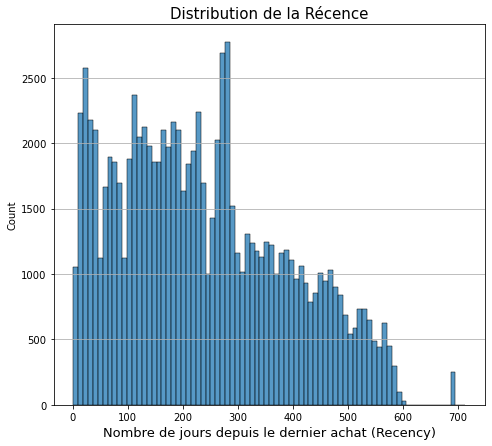

In [95]:
# Distribution du nombre de jours depuis le dernier achat
fig=plt.figure(figsize = (17,7))

ax = fig.add_subplot(1,2, 1)
sns.histplot(x=rfm_rs['Recency'],bins=80,)
ax.set_title("Distribution de la Récence", fontsize=15)
plt.xlabel('Nombre de jours depuis le dernier achat (Recency)',fontsize=13)
plt.grid(axis='y')

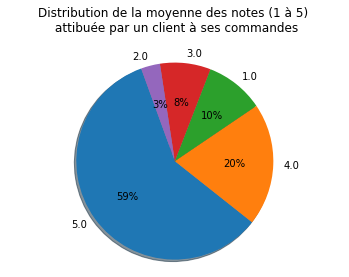

In [96]:
labels =rfm_rs['Review Score'].value_counts(normalize=True).sort_values(ascending=False).index
values =rfm_rs['Review Score'].value_counts(normalize=True).sort_values(ascending=False).values

# Diagramme en secteurs

fig1, ax1 = plt.subplots()
ax1.pie(values, labels=labels, 
        autopct='%1.0f%%', 
        #autopct='%1.1f%%', 

        shadow=True, startangle=110)

ax1.axis('equal')   # Cette ligne assure que le pie chart est un cercle plutôt qu'une éllipse
plt.title("Distribution de la moyenne des notes (1 à 5) \n attibuée par un client à ses commandes\n")
plt.show;

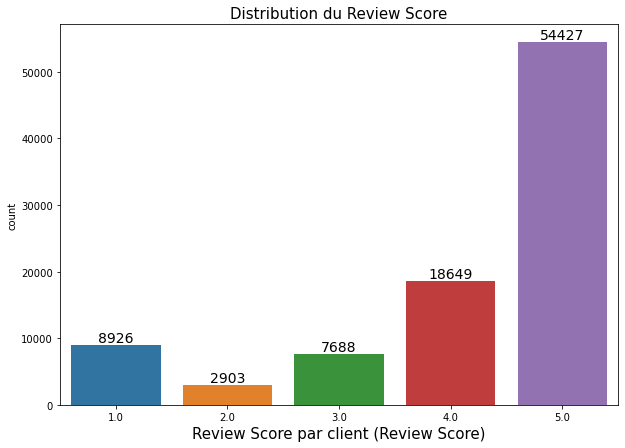

In [97]:
#Distribution du nombre de commandes par client
labels =sorted(rfm_rs['Review Score'].unique().tolist())
fig,ax=plt.subplots(figsize=(10,7))
sns.countplot(x = rfm_rs['Review Score'], order=labels)
plt.title("Distribution du Review Score",fontsize=15)
plt.xlabel('Review Score par client (Review Score)',fontsize=15)
for container in ax.containers:
    ax.bar_label(container,size=14,fmt='%.0f')

In [98]:
# Controle de cohérence, vérification que le montant globale de commande reste le même
rfm_rs['Monetary'].sum()

15271447.84

In [99]:
# Représentation 3D des données selon les axes Récence + Review Score + Montant
fig = px.scatter_3d(rfm_rs, x='Recency', y='Review Score', z='Monetary')
fig.show()

## Exportation des données

In [100]:
rfm.to_csv('Olist_model_1.csv', index=False) # exportation du fichier avec les 3 features RFM
rfm_rs.to_csv('Olist_model_2.csv', index=False) # exportation du fichier avec les 3 features RFM + le review score

Les essais de modélisation sont réalisés dans un notebook séparé.